[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/RatInABox-Lab/RatInABox/blob/main/demos/successor_features_example.ipynb)

# Successor features 

### We use `RatInABox` to successor features under random and biased motion policies

 <img src="../.images/demos/SF_development.gif" width="800" align="center"> 
 
In this tutorial will will show how `RatInABox`, in particular the `SuccessorFeatures` class can be used to model successor features (also called "successor representations"). 

Successor representations encode the expected future occupancy of a given location. As pointed out by Stachenfeld et al. (2017) such representations bear high resemblence to place cells in the hippocampal formation. A natural extension of successor representations is to successor _features_ $\{\psi_i\}$: these encode the expected future activity of a given feature $\{\phi_i\}$. If a feature is, for example, a place cell (encoding location) then the successor feature will be a successor representations for the location encoded by that place cells but in general succeessor features can encode anything. 


$$\hat{\psi_i}(t) = \sigma^{\textrm{non-lin}}\bigg(\sum_j w_{ij} f_j(t)\bigg)  \approx \psi_i^{\pi}(t) = \mathbb{E} \bigg[  \int_{t}^{\infty} e^{-\frac{t^{\prime}-t}{\tau}} \phi_i(t^{\prime}) dt^{\prime}\bigg] $$

Given successor features are a subset of value functions (a successor feature _is_ a value function where the reward is the feature activity) `SuccessorFeatures` are a subclass of `ValueNeuron`s (for more about this class see `reinforment_learning_example.ipynb`). The only substantial difference is that `SuccessorFeatures` insist on you passing in at initialisation a set of features which are then used on each `update_weights()` step as the multidimensional reward signal. Temporal difference learning is handled by the `ValueNeuron` parent class. 

In [1]:
!pip install ratinabox
!pip install tqdm

In [2]:
from ratinabox.Environment import Environment
from ratinabox.Agent import Agent
from ratinabox.Neurons import *
from ratinabox.contribs.SuccessorFeatures import SuccessorFeatures
from tqdm.auto import tqdm # progress bar
ratinabox.stylize_plots(); ratinabox.autosave_plots=True; ratinabox.figure_directory = "../figures/"

%load_ext autoreload
%autoreload 2

Lets remind ourselves of the default params for successor features

In [3]:
SuccessorFeatures.get_all_default_params()

{'n': 1,
 'name': 'FeedForwardLayer',
 'color': None,
 'noise_std': 0,
 'noise_coherence_time': 0.5,
 'min_fr': 0.0,
 'max_fr': 1.0,
 'save_history': True,
 'input_layers': [],
 'activation_function': {'activation': 'relu'},
 'biases': None,
 'tau': 2,
 'tau_e': None,
 'eta': 0.001,
 'L2': 0.001,
 'features': None}

## Open field foraging

100 small place cells are initialised in a 1 x 1 m environment containing a wall. SuccessorFeatures wuth a predictive time horizon of 10 seconds are trained on these features. (The bassi set is taken to be the place cells as well, this double use is optional and alternatively a seperate set of neurons caould be used as the basis features i.e. `params['input_layers'])

In [4]:
Env = Environment()
Env.add_wall([[0.5,0],[0.5,0.5]])
Ag = Agent(Env,params={'dt':0.1})
features = PlaceCells(Ag, params={"n": 100, "widths": 0.1}) 
SFs = SuccessorFeatures(Ag, params={"features": features,
                                    "input_layers": [features],
                                    'tau':10, #preditive time horizon
                                    'eta':0.01,
                                    })


Train for 1000 seconds

100%|██████████| 10000/10000 [00:20<00:00, 491.60it/s]


Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/trajectory_2118.png  & .svg


(<Figure size 600x600 with 1 Axes>, <AxesSubplot:>)

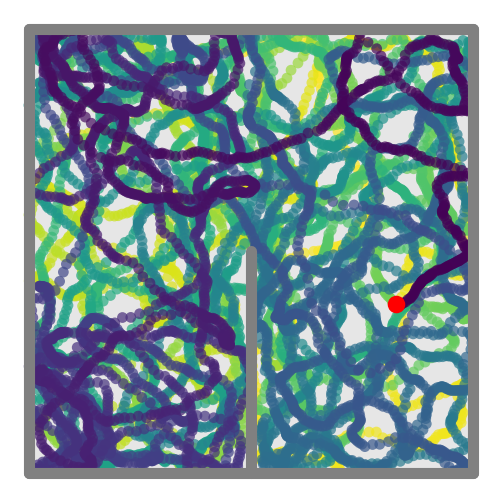

In [5]:
for i in tqdm(range(int(1000 / Ag.dt))): 
    Ag.update()
    features.update()
    SFs.update()
    SFs.update_weights()
Ag.plot_trajectory(color='changing')

Plot features and successor feature rate maps for comparison. Notice how the successor features are centred on the features but are overall larger and more diffuse. This is because they are encoding locatons which are likely to cause the feature to be active in the near future under the random motion policy.

Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/PlaceCells_ratemaps_2118.png  & .svg
Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/FeedForwardLayer_ratemaps_2118.png  & .svg


Text(0.5, 0.98, 'Successor features')

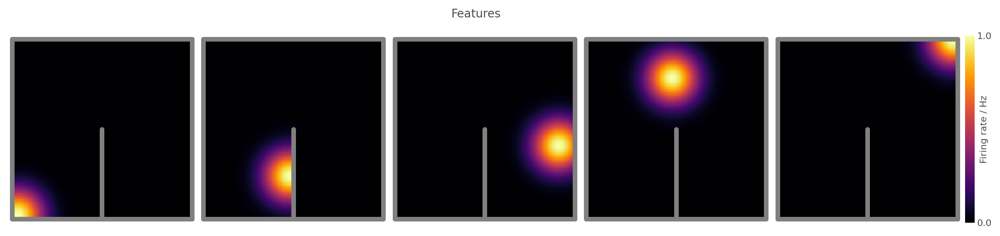

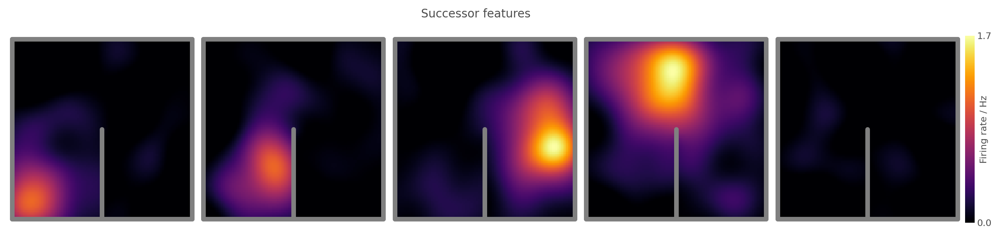

In [6]:
fig, ax = features.plot_rate_map(chosen_neurons=5)   ;   fig.suptitle("Features")
fig, ax = SFs.plot_rate_map(chosen_neurons=5)        ;   fig.suptitle("Successor features")

## Circular environment with policy bias

Make a loop environment of radius 50 cm and bias the agent policy so it moves anticlockwise around the loop. 

In [7]:
def setup_loop_experiment(): #loop environment
    Env = Environment(
        params={
        'boundary':[[0.5*np.cos(t),0.5*np.sin(t)] for t in np.linspace(0,2*np.pi,100)],
        'holes':[[[0.4*np.cos(t),0.4*np.sin(t)] for t in np.linspace(0,2*np.pi,100)]],
        })

    Ag = Agent(Env,params={'dt':0.1})

    #small place cells evenly distributed around the loop
    features = PlaceCells(Ag, params={
        "n": 100,
        "widths": 0.1,
        "place_cell_centres":np.array([[0.45*np.cos(t),0.45*np.sin(t)] for t in np.linspace(0,2*np.pi,100)]),
        'wall_geometry':'euclidean'}) 
    SFs = SuccessorFeatures(Ag, params={
        "features": features,
        "input_layers": [features],
        "tau":10,
        "tau_e":0.5, #usually a longer eligibilty trace is used but this will show backwards expansion better
        "eta":0.02})
    SFs.inputs['PlaceCells']['w'] *= 0.1 
    return Env,Ag,features,SFs

Env, Ag, features, SFs = setup_loop_experiment()

Train for 1000 seconds. The drift velocity is tangential to the agents position causing circular motion. This simulation is a little slower than usual due to how many walls we had to add to make a loop. 

In [8]:
def update_loop_experiment():
    drift_velocity = 0.5 * np.array([-Ag.pos[1], Ag.pos[0]]) #tangential drift moves agent anticlockwise round loop
    Ag.update(drift_velocity=drift_velocity, drift_to_random_strength_ratio=2)
    features.update()
    SFs.update()
    SFs.update_weights()

In [9]:
for i in tqdm(range(int(1000 / Ag.dt))): # 1 hr exploration
    update_loop_experiment()

  0%|          | 11/10000 [00:00<01:48, 92.26it/s]

100%|██████████| 10000/10000 [00:23<00:00, 433.06it/s]


Animate 60 seconds of the trajectory

In [10]:
Ag.animate_trajectory(t_end=60,speed_up=6,color='changing')

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/trajectory_2118.mp4


Display 4 of the features above their learned successor features. Notice how the successor features skew clockwise around the track. This is because they are encoding locations which are likely to transition to the location of the feature in the near future but under the biased (anticlockwise) motion policy this results in a backwards expansion. 

Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/PlaceCells_ratemaps_2119.png  & .svg
Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/03_11_23/FeedForwardLayer_ratemaps_2119.png  & .svg


(<Figure size 2399.7x599.849 with 8 Axes>,
 array([<Axes:>, <Axes:>, <Axes:>, <Axes:>], dtype=object))

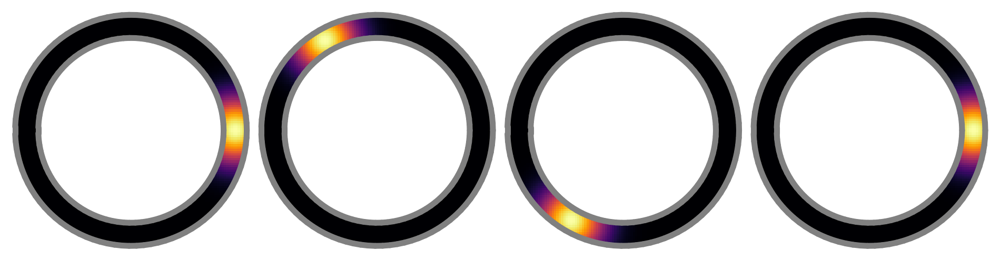

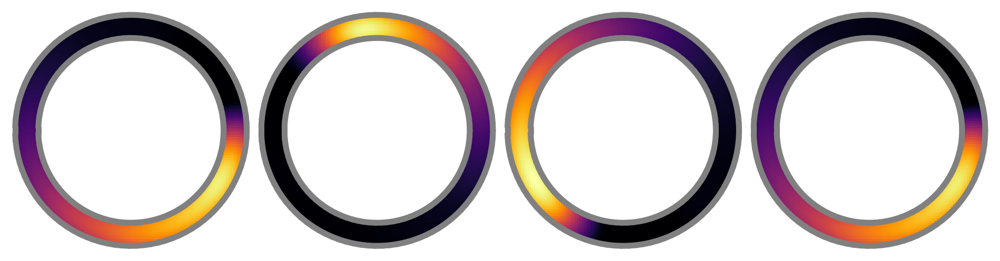

In [11]:
features.plot_rate_map(chosen_neurons=4,colorbar=False)
SFs.plot_rate_map(chosen_neurons=4,colorbar=False)

### Animate how one successor feature changes over time 

Beware, this could take a few minutes to run 

In [76]:
Env, Ag, features, SFs = setup_loop_experiment()

import matplotlib.animation

T_max = 20*60 # total elarning time 20 minutes
plot_every = 60 / 10 #new frame every fifth of a minute
# T_max = 10*60 # total elarning time 20 minutes
# plot_every = 60 #new frame every fifth of a minute

fig, axs = features.plot_rate_map(chosen_neurons=2,colorbar=False,autosave=False)
SFs.plot_rate_map(chosen_neurons=1,autosave=False,colorbar=False, fig=fig,ax=axs[1])
axs[0].set_title("Feature")
axs[1].set_title("Successor feature")

def animate(i,fig,axs):
    for i in range(int(plot_every/Ag.dt)):
        update_loop_experiment()
    axs[1].clear()
    axs[1].text(-0.7,0.45,f"Time / min: {round(Ag.t/60,2)}",size=7)
    axs[1].set_title("Successor feature")
    SFs.plot_rate_map(chosen_neurons=1,autosave=False,fig=fig,ax=axs[1],colorbar=False)
    plt.close()
    return

anim = matplotlib.animation.FuncAnimation(
    fig,
    animate,
    interval=50, #ms between frames
    frames=int(T_max/plot_every),
    blit=False,
    fargs=(fig, axs),)

ratinabox.utils.save_animation(anim,"sf_loop")

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/24_04_23/sf_loop_1538.mp4  & .gif


'../figures/24_04_23/sf_loop_1538'